# What are the Philosophers Talking About?

# Install and load libraries

The following functions and packages are used in the whole projects.

In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.set_option('max_colwidth',100)
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" 
from ipywidgets import widgets, interact, interactive, fixed
import pickle
import nltk
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

from functions import lemmatized_sentence,plot_wordcloud,generate_topics,display_topics,tsne_plot_school,sentiment_generate

import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)

# these packages may be downloaded for re-running the whole project.
# !pip install plotly
# !pip install --upgrade pandas==1.2
# !pip install pyLDAvis

# Introduction

A literal study of philosophical works is necessary. Philosophical language is very abstract, but if you extract words from text and then observe and study them, you can draw many interesting conclusions. The philosophical issues studied by different schools and the philosophical fields studied by different philosophers may have commonalities as well as differences. 

The main focus of this article is to see if there are some interesing overlaps of topics between schools or not, using topic modeling. Next we see what exactly they are talking about with detailed sentences.

# Part 1 Data Preprocessing

Import data from Kaggle: History of Philosophy (https://www.kaggle.com/kouroshalizadeh/history-of-philosophy) and take a look at the dimention and structure of dataset.

In [4]:
df = pd.read_csv('/Users/xiayiming/Desktop/philosophy_data.csv',encoding="UTF-8")
df.info()
df['title'].nunique()
df['author'].nunique()
df['school'].nunique()
schools=df['school'].unique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360808 entries, 0 to 360807
Data columns (total 11 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   title                      360808 non-null  object
 1   author                     360808 non-null  object
 2   school                     360808 non-null  object
 3   sentence_spacy             360808 non-null  object
 4   sentence_str               360808 non-null  object
 5   original_publication_date  360808 non-null  int64 
 6   corpus_edition_date        360808 non-null  int64 
 7   sentence_length            360808 non-null  int64 
 8   sentence_lowered           360808 non-null  object
 9   tokenized_txt              360808 non-null  object
 10  lemmatized_str             360808 non-null  object
dtypes: int64(3), object(8)
memory usage: 30.3+ MB


59

36

13

As we may see, the dataset contains 360808 rows and 11 columns. Variables $original\_publication\_date$, $corpus\_edition\_date$, $sentence\_length$ are integer, while the rest of variables are object. No null values are detected. Moreover, the dataset contains 59 different books written by 36 authors from 13 distinct schools.

More information can be extracted after NLP for variable $tokenized\_txt$ by eliminating stop words and lemmatize sentences using function 'lemmatized_sentence'. The lemmatized sentences are stored in variable $lemmatized\_str$ and the lengths for those sentences are stored in variable $lemmatized\_str\_len$.

In [ ]:
# this may take a while and i have saved the result in the file 'philosophy_data_new'. 
# You just need to run the first cell in part 2 for further analysis.

# df['lemmatized_str'] = df['tokenized_txt'].apply(
#     lambda x: lemmatized_sentence(ast.literal_eval(x))
# )
# df['lemmatized_str_len'] = df['lemmatized_str'].apply(
#     lambda x: len(x.split(' '))
# )

In [ ]:
# save the completed data to new file using the code below

# df.to_csv('/Users/xiayiming/Desktop/philosophy_data_new.csv')

# Part 2 EDA

To process exploration for data, take a brief view over the data. I will only pick variables $title$, $author$, $school$, $original\_publication\_date$, $sentence\_length$, $sentence\_lowered$, $tokenized\_txt$, for exploratory data analysis.

In [3]:
df = pd.read_csv('/Users/xiayiming/Desktop/philosophy_data_new.csv',encoding="UTF-8")

In [4]:
df=df[['title','author','school','original_publication_date','sentence_length','sentence_lowered','tokenized_txt','lemmatized_str','lemmatized_str_len']]

In [7]:
# 1. Which school has the most amount of titles in the dataset?

d1=df.groupby('school')['title'].nunique().sort_values(ascending=False).to_frame(name='count').reset_index()
fig = px.bar(d1, x='school', y='count', title='The Amount of Titles Per School', labels={
                     'school': 'school',
                    'count': 'count'
                 })
fig.update_traces(marker_color='pink')
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/EDA_1.png')

<Figure size 432x288 with 0 Axes>

In [8]:
# 2. Which author is most productive?(with most titles and sentences)
d2=df.groupby('author')['title'].nunique().sort_values(ascending=False).to_frame(name='count').reset_index()
fig = px.bar(d2, x='author', y='count', title='The Amount of Titles Per Author', labels={
                     'author': 'school',
                    'count': 'count'
                 })
fig.update_traces(marker_color='pink')
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/EDA_2a.png')


d3=df.groupby('author')['title'].count().sort_values(ascending=False).to_frame(name='count').reset_index()
fig = px.bar(d3, x='author', y='count', title='The Amount of Sentences Per Author', labels={
                     'author': 'school',
                    'count': 'count'
                 })
fig.update_traces(marker_color='pink')
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/EDA_2b.png')

<Figure size 432x288 with 0 Axes>

In [5]:
# 3. which title(book) has the most sentences in this dataset? Are the sentences distributed as normal?
d4=df.groupby('title')['title'].count().sort_values(ascending=False).to_frame(name='count').reset_index()
fig = px.bar(d4, x='title', y='count', title='The Amount of Sentences Per Title', labels={
                     'author': 'school',
                    'count': 'count'
                 })
fig.update_traces(marker_color='pink')
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/EDA_3a.png')

# histogram
fig = px.histogram(d4, x="count", title='Histogram of the Sentenses')
fig.update_traces(marker_color='pink')
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/EDA_3b.png')

<Figure size 432x288 with 0 Axes>

In [6]:
#4. How many sentences per school? Is the amount of titles per school positively correlated to the amount of sentences per school?

df_2=df.groupby('school')['title'].count().to_frame(name='n_sentence').reset_index()
a_1=df.groupby('school')['title'].nunique()
df_2['n_title']=a_1.tolist()

df_2.head()
fig = px.scatter(df_2,x='n_sentence', y='n_title', title='Scatter Plot of Amount of Sentences and Titles')
fig.show()
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/EDA_4.png')
np.corrcoef(df_2['n_sentence'],df_2['n_title'])

,school,n_sentence,n_title
0,analytic,55425,11
1,aristotle,48779,1
2,capitalism,18194,3
3,communism,17958,3
4,continental,33779,6


array([[1.        , 0.38315843],
       [0.38315843, 1.        ]])

<Figure size 432x288 with 0 Axes>

In [7]:
#5. What is the average length of sentence per title? Is it correlated to the amount of sentences per title?
df_3=df.groupby(['title'])['title'].count().to_frame(name='n_sentence').reset_index()
df_4=df.groupby('title').mean()
df_3['mean_sentence_length']=df_4['sentence_length'].tolist()

df_3.head()
fig = px.scatter(df_3,x='n_sentence', y='mean_sentence_length', title='Scatter Plot of Amount of Sentences and Means of Sentenses\' Lengths ')
fig.show()
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/EDA_5.png')
np.corrcoef(df_3['n_sentence'],df_3['mean_sentence_length'])

,title,n_sentence,mean_sentence_length
0,"A General Theory Of Employment, Interest, And Money",3411,196.654060
1,A Treatise Concerning The Principles Of Human Knowledge,1040,184.724038
2,A Treatise Of Human Nature,7047,183.008372
3,Anti-Oedipus,6679,165.508459
4,Aristotle - Complete Works,48779,153.224953


array([[ 1.        , -0.14850189],
       [-0.14850189,  1.        ]])

<Figure size 432x288 with 0 Axes>

### Observations

- As shown above, Analytic has the most amount of works, beginning around the turn of the 20th century in the contemporary era. This may show that the main focus in the research of philosophy was focusing heavily on that at that particular period. However, Rationalism, Continental, and Empiricism have relatively equal amount of works with no apparent different.

- From the plots, Nietzsche has 5 titles in the dataset, who owns most amount of works. Aristotle has 48779 sentences, but all from only one work. Hegel and Foucault both appeared at the front, having same amount of titles and ralatively large amount of sentences.

- Aristotle - Complete Works has the most amount of sentences and Plato - Complete Works is in rank 2. The amount of sentences per title does not distributed normally.

- There is no apparent correlation between the amount of titles per school and the amount of sentences per school.

- There is no apparent correlation between the average length of sentence per title and the amount of sentences per title.

### Timeline figure and more insights

In [8]:
temp=df.groupby(by=['original_publication_date','school'])['title'].nunique().to_frame(name='count').reset_index()
temp['original_publication_date'] = temp['original_publication_date'].apply(str)
fig = px.bar(temp, x="original_publication_date", color="school",
             y='count',
             title="Timeline for the Amount of Works Per School",
             barmode='group',
             height=600
            )

fig.show()
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/EDA_timeline.png')

<Figure size 432x288 with 0 Axes>

This is the timeline showing the amount of works classified by schools at different time spots.

It starts from early 350 B.C. and lasts to late 20th century. The data does not contain much works for the medieval peroid. During Renaissance of the 15th and 16th centuries heralded the beginning of the modern period, a lot more schools took place by the various colors showing up in the figure.

As we may also observe, in 1888, 3 books from nietzsche were published. Nietzsche was productive at that specific year. From certain color continuous showing up on the timeline, we can also notice that there were obvious trends for some schools to be popular for a period of time. For instance, from 1781 to 1820, German\_idealism had been continuously publishing books. Similarly, Analytics showed the first work in 1910 and kept showing up from time to time, even till year 1985.

# Part 3 Topic Modeling

In [10]:
# delete na after lemmatizing
# test is a copy of dataframe df
df=df[df['lemmatized_str'].notna()]
test=df.copy(deep=True)

In [11]:
# create count vectorizer and transform sentences to word count matrix
tf_vectorizer = CountVectorizer(strip_accents = 'unicode',
                                stop_words = 'english',
                                lowercase = True,
                                token_pattern = r'\b[a-zA-Z]{3,}\b',
                                max_df = 0.5, 
                                min_df = 10)
dtm_tf = tf_vectorizer.fit_transform(test['sentence_lowered'])
tfidf_vectorizer = TfidfVectorizer(**tf_vectorizer.get_params())
dtm_tfidf = tfidf_vectorizer.fit_transform(test['sentence_lowered'])

### Create Topic Models

In [ ]:
# since this took a long time , i save the result in .pkl files by next cell
# # for dtm_tf
# lda_tf = LatentDirichletAllocation(n_components=20, random_state=0)
# lda_tf.fit(dtm_tf)

# # for dtm_tfidf
# lda_tfidf = LatentDirichletAllocation(n_components=20, random_state=0)
# lda_tfidf.fit(dtm_tfidf)

In [ ]:
# save it in a .pkl file
# you can just open the file which contains the lda results in the next cell

# with open("/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/output/lda_tf.bin", "wb") as f:
#     pickle.dump(lda_tf, f)

# with open("/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/output/lda_tfidf.bin", "wb") as f:
#     pickle.dump(lda_tfidf, f)

In [12]:
# open .pkl file
with open('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/output/lda_tf.bin', 'rb') as f:
    lda_tf = pickle.load(f)

with open('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/output/lda_tfidf.bin', 'rb') as f:
    lda_tfidf = pickle.load(f)

Take a look at most frequent words over whole sentences.

In [14]:
# count words through all sentences 
words = tf_vectorizer.get_feature_names()
count_total = dtm_tf.sum(axis=0)
top10_words = np.array(count_total.argsort()[:, (count_total.shape[1] - 10) : count_total.shape[1]])[0]

# get words with top 10 and visualize them
top10_words_list = [words[i] for i in top10_words]
count_sum = np.array(count_total)[0]
counts = [count_sum[i] for i in top10_words]
top10_words_counts = dict(zip(top10_words_list,counts))
top10_words_df = pd.DataFrame(pd.Series(top10_words_counts)).sort_values(0, ascending = False)
top10_words_df['word'] = top10_words_df.index

fig = px.bar(top10_words_df, x='word', y=0, title='Top 10 Words Frequency', labels={
                     'word': 'Word',
                    '0': 'Count'
                 })
fig.update_traces(marker_color='pink')
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/Topwords.png')

<Figure size 432x288 with 0 Axes>

From the bar plot, the highest count is given to 'things' and 'man', this makes sense since man and things appear commonly in sentences as a general word. We can find out that 'time', 'nature', 'world', 'reason' are things they care about and maybe they always bring up questions like, 'What is the meaning of time?', 'How to behave in a natural way?', 'What is the reason for doing this?'. 

### pyLDAvis Visualization

Next I use the package pyLDAvis to visualize the LDA model. Some points should be clearly explained:

For the left panel,
- Each circle represents a topic. There are total 20 topics in this model.
- The centers of cirlces are determined by computing the distance between topics
- The topic's overall prevalance is encoded by areas of the circles.

For the right panel,
- Move the mouse to one circle, when it turns red, red bars in the right barchart show the individual terms that are most useful for interpreting the current selected topic on the left. 
- The blue parts show the both the corpus-wide frequency of a given term as well as the topic-specific frequency of the term
- Obviously, the plots are interacted.

In [19]:
# this may take some time
pyLDAvis.sklearn.prepare(lda_tf, dtm_tf, tf_vectorizer,sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0      0.082383 -0.064791       1        1  3.582377
1     -0.171803 -0.015875       2        1  7.860852
2      0.127171  0.179385       3        1  4.847037
3      0.098160 -0.186970       4        1  4.984763
4     -0.094311  0.033981       5        1  7.924848
5      0.107027 -0.134983       6        1  7.076039
6     -0.177802  0.063773       7        1  4.749357
7     -0.126917 -0.001436       8        1  6.767837
8      0.145571 -0.049196       9        1  4.983568
9      0.173385  0.114288      10        1  4.566027
10     0.186543  0.011967      11        1  5.515259
11    -0.092331  0.189291      12        1  5.357481
12     0.097805  0.115551      13        1  3.756510
13    -0.238965 -0.146176      14        1  5.416953
14    -0.149600 -0.200442      15        1  4.480968
15    -0.098412  0.174818      16        1  3.702075
16     0.120395 -0.057657      17        1  3.233528
17     0.130743 -0.136511      18        1  4.258164
18    -0.044627  0.120307      19        1  3.240250
19    -0.074414 -0.009326      20        1  3.696106, topic_info=                   Term          Freq         Total Category  logprob  loglift
10997               man  15869.000000  15869.000000  Default  30.0000  30.0000
18354              time  15545.000000  15545.000000  Default  29.0000  29.0000
18238            things  16842.000000  16842.000000  Default  28.0000  28.0000
19999             world  11824.000000  11824.000000  Default  27.0000  27.0000
10259              know   7734.000000   7734.000000  Default  26.0000  26.0000
7941               good  10053.000000  10053.000000  Default  25.0000  25.0000
18233             thing  10875.000000  10875.000000  Default  24.0000  24.0000
14773            reason  11386.000000  11386.000000  Default  23.0000  23.0000
15916               say  12630.000000  12630.000000  Default  22.0000  22.0000
18239             think   7528.000000   7528.000000  Default  21.0000  21.0000
19334             value   6205.000000   6205.000000  Default  20.0000  20.0000
19731               way  12894.000000  12894.000000  Default  19.0000  19.0000
10533               let   5017.000000   5017.000000  Default  18.0000  18.0000
12966             parts   5223.000000   5223.000000  Default  17.0000  17.0000
13904           present   7335.000000   7335.000000  Default  16.0000  16.0000
17128             state   7010.000000   7010.000000  Default  15.0000  15.0000
3508      consciousness   5815.000000   5815.000000  Default  14.0000  14.0000
10284            labour   5409.000000   5409.000000  Default  13.0000  13.0000
8804              ideas   6173.000000   6173.000000  Default  12.0000  12.0000
18723              true   9215.000000   9215.000000  Default  11.0000  11.0000
12245            object   8637.000000   8637.000000  Default  10.0000  10.0000
10342          language   4647.000000   4647.000000  Default   9.0000   9.0000
19959             women   4028.000000   4028.000000  Default   8.0000   8.0000
4915                did   4203.000000   4203.000000  Default   7.0000   7.0000
7919                god   6987.000000   6987.000000  Default   6.0000   6.0000
16132              self   7284.000000   7284.000000  Default   5.0000   5.0000
4931         difference   4623.000000   4623.000000  Default   4.0000   4.0000
11474              mind   6698.000000   6698.000000  Default   3.0000   3.0000
7418               form   9196.000000   9196.000000  Default   2.0000   2.0000
3311            concept   5677.000000   5677.000000  Default   1.0000   1.0000
2054              brain   1109.469987   1111.788457   Topic1  -4.7541   3.3271
5657               ears    346.868950    347.817740   Topic1  -5.9168   3.3264
17257           stories    284.752424    285.701228   Topic1  -6.1141   3.3258
11998            nerves    231.953406    232.902194   Topic1  -6.3192   3.3251
11808           muscles   

As is shown above, there are 8 distinct topics which do not overlapped with other circles, and 4 clusters with different topics which might have similar philosophy opinions or questions. Due to limited time, I will only explore the topics which are overlapped and might have similarity research topics since those are what I am caring about.

So start discussing topics from bottom to top, from right to left.

First is a cluster which includes topic 4, 6, and 18. topic 4 has top words like 'place', 'water', 'animals', 'earth', which are closely related to nature. Topic 6 contains words like 'value', 'labor', 'money' and 'capital' which discusses things on a more social level, these are more correlated to human behaviors. Not surprisingly, topic 18 which overlapped largely with topic 6 contains words like 'woman', 'social', 'desire', 'production', which mostly involve values and labor. Maybe the questions around those three topics would be like the social distribution of natural resources and the rational value distribution of human resources.

Next is another cluster containing topic 1, 9, 17. Topic 9 has top words like 'state', 'power', 'laws' and 'government', which to me are highly correlated to politics. And topic 17 has words like 'action', 'employment', 'investment', and even 'violence'. The similarity between these two topics might be more about the balance between political power and social class supply and demand. Topic 1 has words 'body', 'spirits' and words related to foods, can be reasonably explained with supply and demand.

Move to right cluster with topic 5, 8, 2 and 20. Topic 20 says a lot about time and space while topic 5 talks more about existance, mind and soul. Topic 8 discuss more on sense, life and meaning. Those 3 topics might bring up ideas about explorations on the meaning of life in the dimension of time and space. Topic 2 has words like 'concept', 'consciousness' and 'experience', and may combine topic 8 with topics around exploring life on the basis of self-ideology.

Last, the cluster on the bottom right consists of topic 12 and 16. Topic 12 has words like 'true', 'false', 'argument', 'proof', 'method' and words like 'reason', 'sense', 'doubt' and 'explanation' are coming from topic 16. These two topics seem to discuss things like how to conduct effective dialectics and how to judge or support personal thinkings.

### Get into specific sentence with top words ( Simple examples)

In [20]:
test[test['sentence_lowered'].str.contains('labour')][['school','sentence_lowered']].iloc[[3,444,666,222,999]]

,school,sentence_lowered
52607,aristotle,for god is in very truth the preserver and creator of all that is in any way being brought to pe...
290029,communism,"in general, the greater the productiveness of labour, the less is the labour time required for t..."
291011,communism,"it is because all commodities, as values, are realised human labour, and therefore commensurable..."
198712,continental,"as in all the other cases, the remuneration of agricultural labour tends to regulate itself so a..."
292977,communism,"where reference is made to labour as a measure of value, it necessarily implies labour of one pa..."


In [21]:
test[test['sentence_lowered'].str.contains('class')][['school','sentence_lowered']].iloc[[3790,888,2222,3333,4000]]

,school,sentence_lowered
336048,nietzsche,"zarathustra rejoices that the war of the classes is at last over, and that now at length the tim..."
151011,analytic,we may classify the sentential meanings represented by these base structures also as performative.
199526,continental,for comparative anatomy is not merely a deepening of the descriptive techniques employed in the ...
306448,communism,"opportunism, therefore, cannot now triumph in the working class movement of any country for deca..."
360207,feminism,"working class men, whatever their color, can be motivated to rape by the belief that their malen..."


It seems that the production methonds are heatedly discussed in topic 6 when looking into the word 'labour'. And the word 'class' from topic 18 always associated with 'work', which is also related to 'labour'. So indeed, we can find some similarities in topic 6 and 18 and the hypothesis made in the former section hence makes sense.

### Topic distrubution - Bar plot

In [ ]:
# # we save the result from the next two cells.

# # store top words per topic 

# num_words =30
# topic_list= list()
# words = tf_vectorizer.get_feature_names()
# for topic_idx, topic in enumerate(lda_tf.components_):
#         topic_list.append(' '.join([words[i]
#                         for i in topic.argsort()[:-num_words - 1:-1]]))

In [ ]:
# # transform sentence to topic distributions using LDA model
# topic_name = ['Topic '' + str(i) for i in range(1,lda_tf.n_components+1)]
# topic_matrix = lda_tf.transform(dtm_tf)

# # assign each sentence a dominant topic
# df_topic = pd.DataFrame(np.round(topic_matrix, 4), columns=topic_name)
# dominant_topic = np.argmax(df_topic.values, axis=1)
# df_topic['dominant_topic'] = dominant_topic + 1

# # combine this with the main dataframe and save to the output folder 
# # !pip install pandas==1.1.5 ,this might be useful

# df_new = pd.concat([test, df_topic], axis = 1)
# df_new.to_csv('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/output/philosophy_data_dominantTopic.csv')

In [22]:
df_new = pd.read_csv('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/output/philosophy_data_dominantTopic.csv',encoding="UTF-8")

Overall, the LDA model can create a matrix with rows representing proportions of each sentence assigned to each topic based on the words it contains. The rows can be treated as a topic distribution where a dominant topic can be assigned per sentence. Below is the distribution and the result for dominant topic I mentioned.

In [23]:
df_new.head()

,Unnamed: 0,title,author,school,original_publication_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str,lemmatized_str_len,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,Topic 17,Topic 18,Topic 19,Topic 20,dominant_topic
0,0,Plato - Complete Works,Plato,plato,-350.0,125.0,"what's new, socrates, to make you leave your usual haunts in the lyceum and spend your time her...","['what', 'new', 'socrates', 'to', 'make', 'you', 'leave', 'your', 'usual', 'haunts', 'in', 'the'...",new socrates make leave usual haunt lyceum spend time king archon court,12.0,0.0042,0.0042,0.5121,0.0042,0.0042,0.0042,0.1221,0.0042,0.0042,0.0042,0.0042,0.0042,0.0042,0.0042,0.0042,0.0042,0.0042,0.0932,0.1049,0.1053,3.0
1,1,Plato - Complete Works,Plato,plato,-350.0,69.0,surely you are not prosecuting anyone before the king archon as i am?,"['surely', 'you', 'are', 'not', 'prosecuting', 'anyone', 'before', 'the', 'king', 'archon', 'as'...",surely prosecute anyone king archon,5.0,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,0.7625,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,0.0125,13.0
2,2,Plato - Complete Works,Plato,plato,-350.0,74.0,"the athenians do not call this a prosecution but an indictment, euthyphro.","['the', 'athenians', 'do', 'not', 'call', 'this', 'prosecution', 'but', 'an', 'indictment', 'eut...",athenian call prosecution indictment euthyphro,5.0,0.0100,0.0100,0.0100,0.0100,0.0100,0.0100,0.0100,0.0100,0.2100,0.3725,0.0100,0.0100,0.0100,0.0100,0.0100,0.0100,0.2475,0.0100,0.0100,0.0100,10.0
3,3,Plato - Complete Works,Plato,plato,-350.0,21.0,what is this you say?,"['what', 'is', 'this', 'you', 'say']",say,1.0,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,0.5250,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,0.0250,12.0
4,4,Plato - Complete Works,Plato,plato,-350.0,101.0,"someone must have indicted you, for you are not going to tell me that you have indicted someone ...","['someone', 'must', 'have', 'indicted', 'you', 'for', 'you', 'are', 'not', 'going', 'to', 'tell'...",someone must indict go tell indict someone else,8.0,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,0.6833,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,0.0167,13.0


By the above table, I can use groupby to see if there are some interesting observations to obtain.

In [24]:
tt=df_new.groupby(['dominant_topic'])['title'].count().sort_values(ascending=False).to_frame(name='count').reset_index()
tt['dominant_topic'] = tt['dominant_topic'].apply(str)

In [31]:
fig = px.bar(tt, x='dominant_topic', y='count',title='Total Words Per Topic', color = 'dominant_topic')
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/Topwords.png')
fig.show()

<Figure size 432x288 with 0 Axes>

From above barplot, topic 5, 2, 8, 12, 6 all have great amount of sentences. And from the result of LDA visualization, we observe that topic 2, 5, 8 are from the same cluster, which makes sense since it is heatedly focused amoung philosophers.

In [28]:
tt1=df_new.groupby(['dominant_topic', 'school'], as_index= False)['title'].count()
tt2=df_new.groupby(['dominant_topic'], as_index= False)['title'].count()
tt3=pd.merge(tt1,tt2,on='dominant_topic',how='left')
tt3['school_percent_perTopic']=tt3['title_x']/tt3['title_y']

tt3=tt3.sort_values(['school_percent_perTopic','school'],ascending=False)
tt3=tt3.pivot(index='dominant_topic', columns='school', values='school_percent_perTopic')
tt3['dominant_topic']=tt3.index.astype(str)

In [32]:
fig = px.bar(tt3, x='dominant_topic', y=[school for school in tt3.columns], title='Proportions of Sentences from Schools Per Topic', labels={
                     'value': 'Proportion of Sentences from Schools',
                    'variable':'Schools'
                 })
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/Proportions_Sentences_Topic.png')
fig.show()

<Figure size 432x288 with 0 Axes>

From the bar plot above, we see that each topic has sentences from different schools, some topics are dominated by particular schools while some have evenly distrubuted proportions for schools. What I most care about are topic 5, 2, 8, 12, 6 and the reason is that they have greater amount of sentences to analyze and also topic 5, 2, 8 are from the same cluster.

In topic 5, school Aristotle, Empiricism and Rationalism have similar proportions of sentences in that topic, it is also true for Continental and Phenomenology from topic 8, Communism and Capitalism from topic 6.

For topic 2 and 12, each has a dominant school, German_idealism and Analytic.

In [33]:
t1=df_new.groupby(['dominant_topic', 'school'], as_index= False)['title'].count()
t2=df_new.groupby(['school'], as_index= False)['title'].count()
t3=pd.merge(t1,t2,on='school',how='left')
t3['topic_percent_perSchool']=t3['title_x']/t3['title_y']

t3=t3.sort_values(['topic_percent_perSchool','dominant_topic'],ascending=False)
t3=t3.pivot(index='school', columns='dominant_topic', values='topic_percent_perSchool')
t3['school']=t3.index

In [34]:
fig = px.bar(t3, x='school', y=[i for i in range(1,20)], title='Proportions of Sentences from Topics Per School', labels={
                     'school': 'School',
                     'value': 'Proportion of Sentences from Topics',
                    'variable':'Topic Number'
                 })
plt.savefig('/Users/xiayiming/Documents/GitHub/spring-2022-prj1-yimingxia-0414/figs/Proportions_Sentences_School.png')
fig.show()

<Figure size 432x288 with 0 Axes>

We may notice that there are correlation between this bar plot and the previous one. Capitalism and Communism both are highly interested in topic 6. Empiricism and Rationalism have preference for topic 5 while Phenomenology and Continental have preference for topic 8.

### Wordclouds visualization - Based on interests from previous analysis.

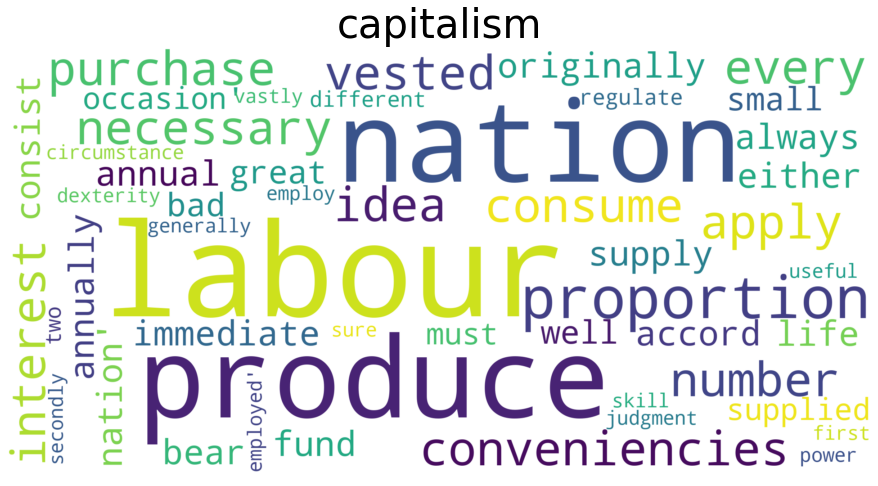

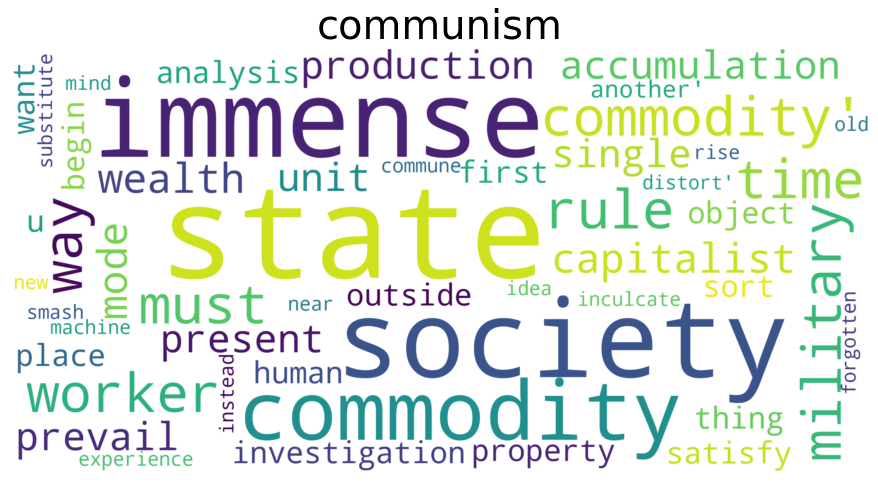

In [36]:
# wordcloud of capitalism and communism 
plot_wordcloud(df,'capitalism',50)
plot_wordcloud(df,'communism',50)

From the wordcloud above, we notice that there are certain connections in topics between two schools. Capitalism talks a lot about labour, proportion, produce, purchase, consume, supply, which makes sense since capitalism's main idea is production of goods and services is based on supply and demand in the general market. However, Communism focuses on society, commodity, immense, unit, wealth, single, which is also reasonable since the main theory is that all property is publicly owned and each person works and is paid according to their abilities and needs. Therefore, it can be illuminated that the main difference between those two schools would be the resources or means of production.

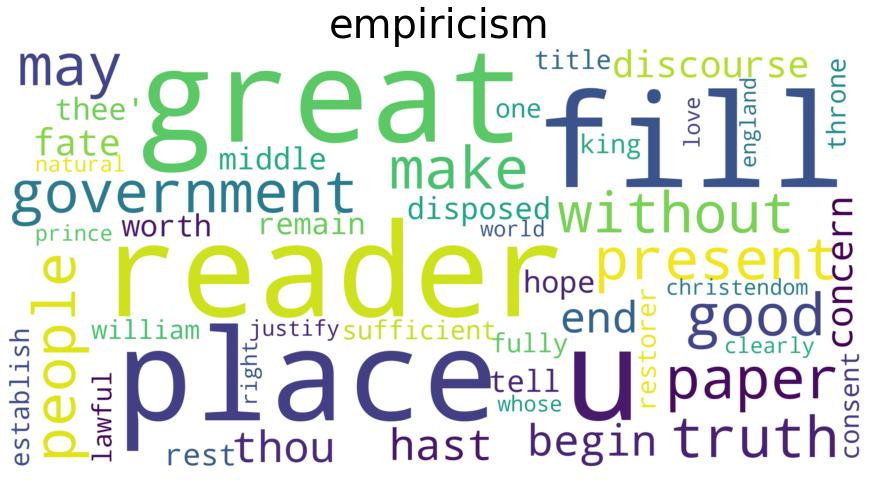

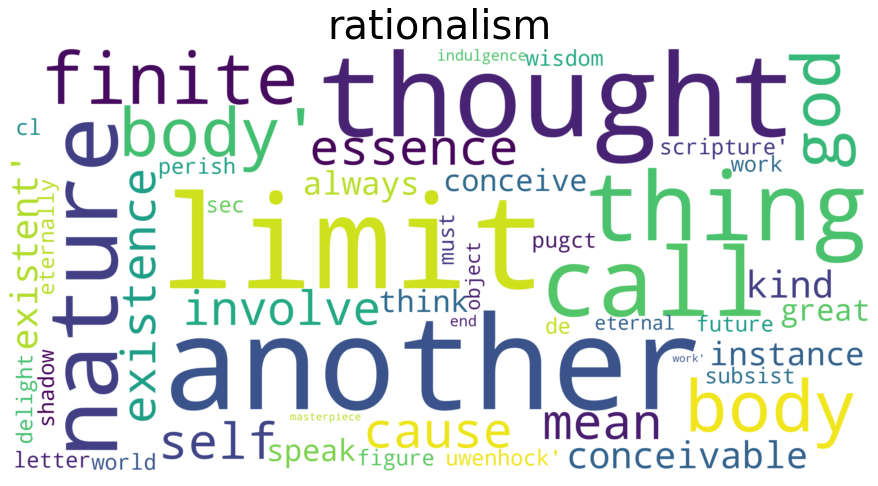

In [37]:
# wordcloud of empiricism and rationalism
plot_wordcloud(df,'empiricism',50)
plot_wordcloud(df,'rationalism',50)

From previous personal background knowledge, I treated Empiricism and Rationalism as two schools holding opposite ideas since empiricism always believe in sense, perception but Rationalism always holds on to inner ideas. As can be verified, Rationalism has top words like 'body', 'thought', 'god', 'self' while 'reader', 'paper', 'place' appear more in Empiricism .

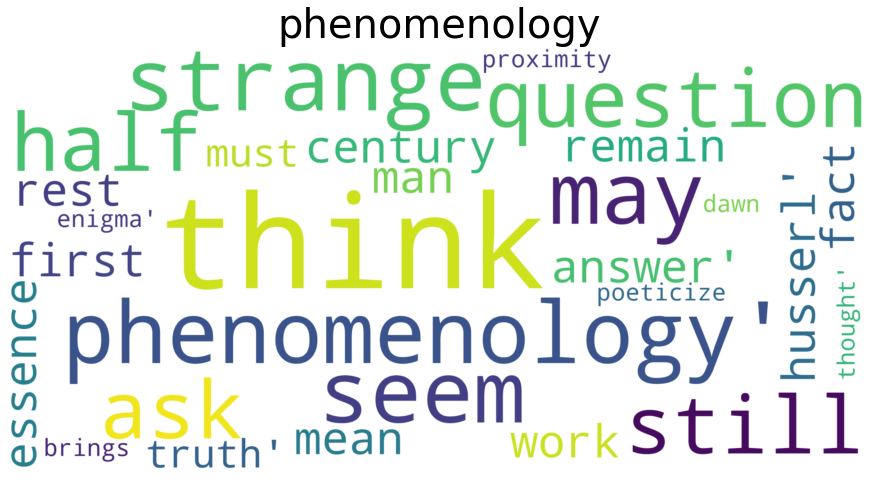

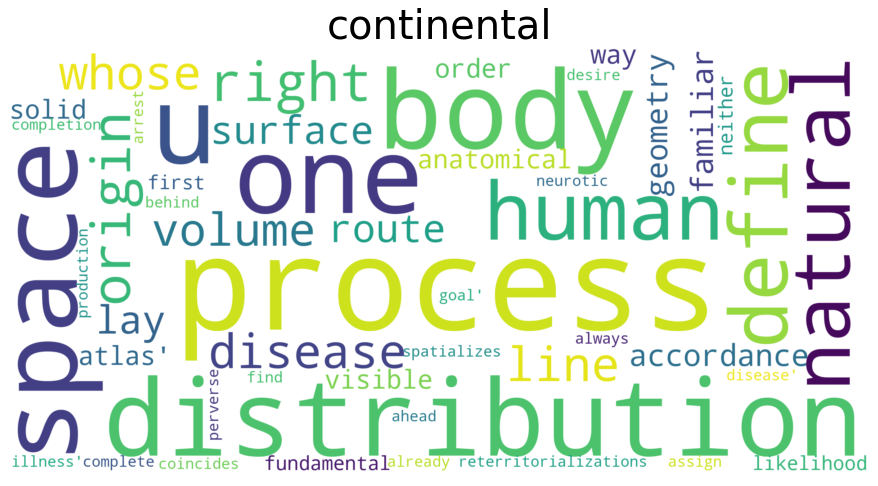

In [38]:
# wordcloud of phenomenology and continental 
plot_wordcloud(df,'phenomenology',50)
plot_wordcloud(df,'continental',50)

Since Phenomenology has words like 'think', 'remain', 'truth', 'answer', and Continental has words like 'body', 'natural', 'space', 'define', they may be talking about similar opinions involving existences and experiences.

### Interactive wordcloud visualizations ( Just for a simple application of interaction in cloudwords)
Below gives us an interaction over wordclouds and the maximum of words of wordclouds can be choosen as 20, 50, 100 and 150.

In [15]:
schools = df["school"].unique().tolist()
interact(plot_wordcloud,df=fixed(df),school=schools,maxword=[20,50,100,150])

interactive(children=(Dropdown(description='school', options=('plato', 'aristotle', 'empiricism', 'rationalism…

<function functions.plot_wordcloud(df, school, maxword)>

### Word2vec visualizations ( For specific words visualization)

Use word2vec to group the vectors of similar words together in vectorspace from couple topics above in which more patterns may be discerned. 

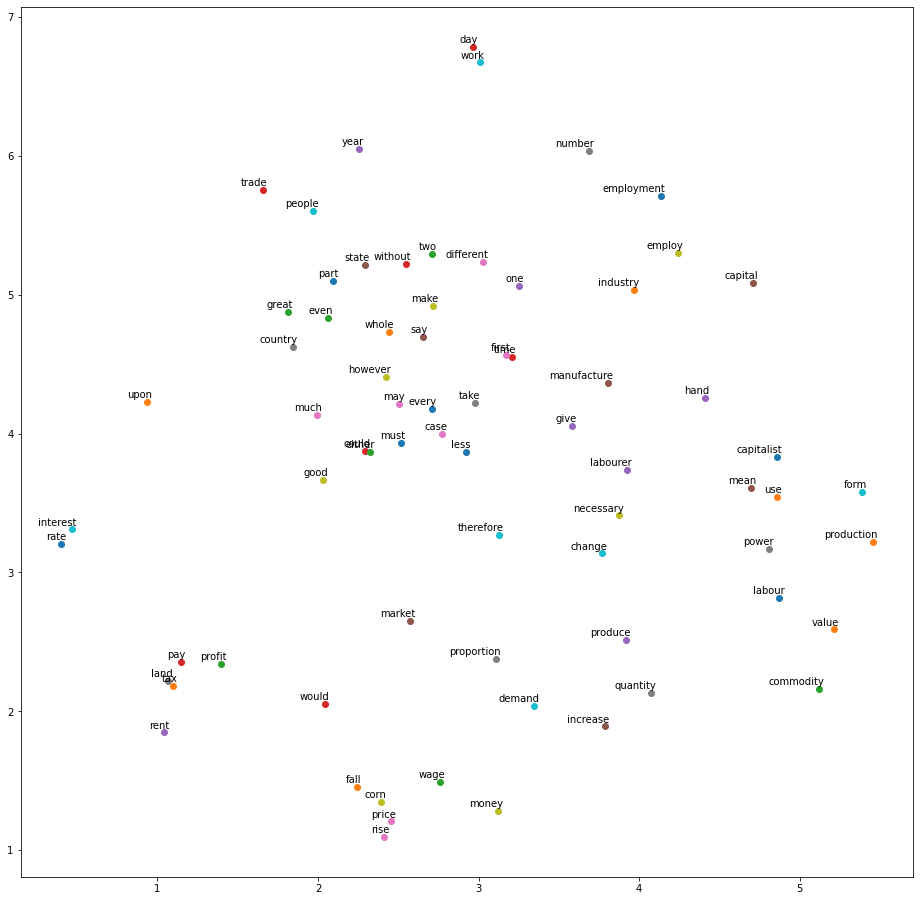

In [40]:
tsne_plot_school(df,'capitalism','communism')

As is shown above, produce, power, labour are pretty close, rent and tax are close. These topics might discuss a lot about production, and money.

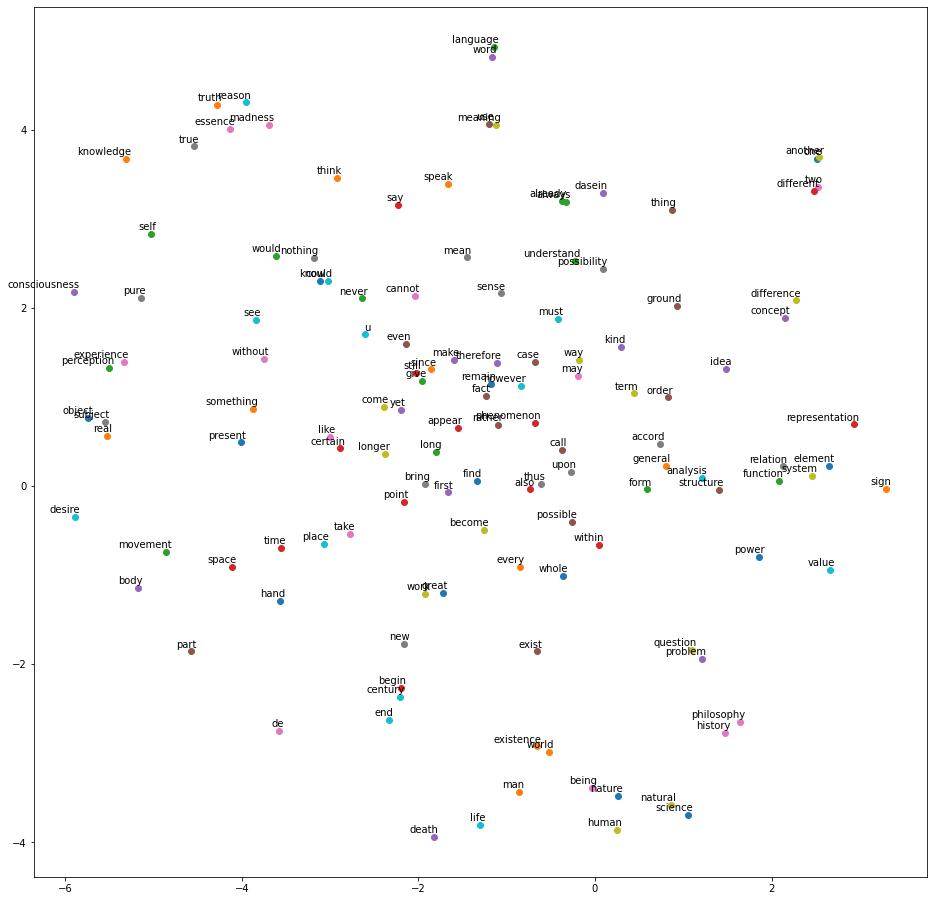

In [41]:
tsne_plot_school(df,'phenomenology', 'continental')

Here, nature, history, philosophy, science are close; function, structure, analysis are close; consciousness, perception, idea, knowledge are close. These two schools may be talking about analysis of functions and also personal experiences.

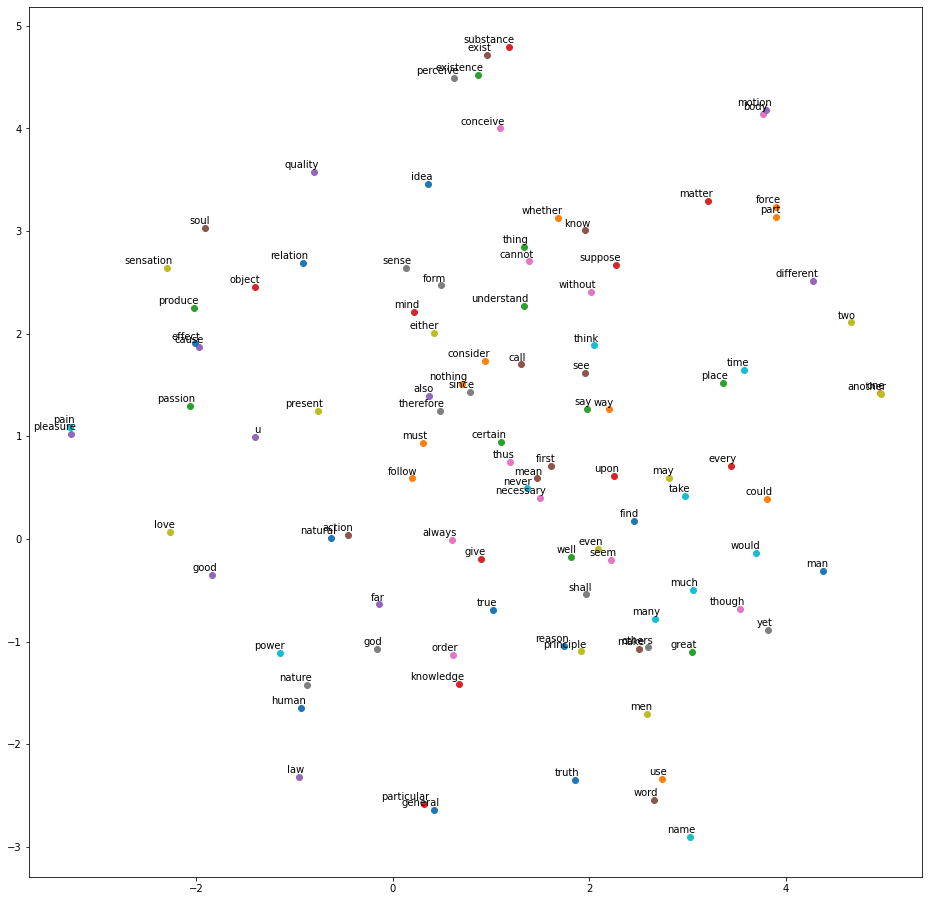

In [42]:
tsne_plot_school(df,'empiricism','rationalism')

From the figure, existence, being are close; sense, cause are close; human, thought, nature are close. These two might be focusing on answering questions like meaning in existance, and human thoughts.

# Part 4 Sentiment Analysis ( Basic application)

In [43]:
df_new=df_new[['school','sentence_lowered','dominant_topic']]

Here, I only want to analyze if two schools' topics are highly correlated, will the sentiment be the same since they can disagree or agree with the same topic?
Schools which I think have topics overlapped:
- Capitalism & Communism
- Phenomenology & Continental
- Empiricism & Rationalism

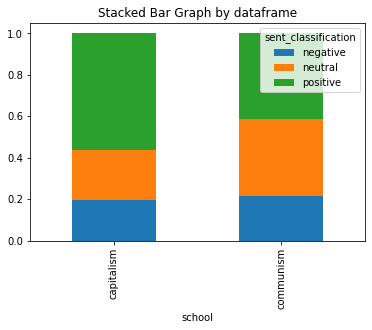

In [44]:
sentiment_generate(df_new,['capitalism','communism'])

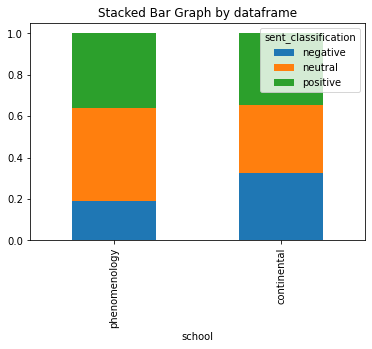

In [45]:
sentiment_generate(df_new,['phenomenology', 'continental'])

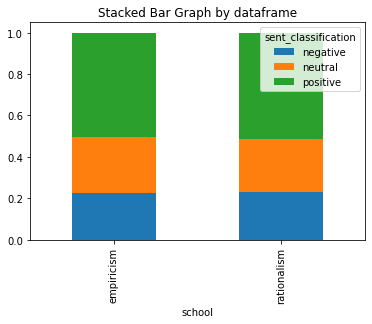

In [46]:
sentiment_generate(df_new,['empiricism','rationalism'])

From the stacked bar plot I conclude that Capitalism and Communism are not negative, but Capitalism talks more positively than Communism. Phenomenology talks less negatively than Continental. Empiricism and Rationalism have equally distribution on sentiments.

# Conclusion

By applying topic modeling, even if we are outsiders of philosophy, we can quickly grasp some patterns. By artificially setting 20 topics, words can be captured and categorized into corresponding topics, and you can observe which topics are overlapping and which are independent topics, and even know how different they are (through the distance). Some words such as nature, man, society, etc., have always been the focus of philosophers.

Then, by giving each sentence a main topic, we can observe the proportion of each school in the topics, and we can also observe the proportion of each topic in the schools, so that we can know which schools focus on similar topics and which schools are unique.

Finally we proceed sentiment analysis. This part is relatively brief, but also quite interesting. We can see that although some schools have opposing views, their attitudes are all positive, and some schools have the same views, but there are always more negative or more positive ones.

More algorithms for machine learning are what I want to continue to study, but there is not enough time. . .